In [4]:
import numpy as np
import scanpy as sc
import pandas as pd
import os
import bbknn
import pandas as pd
import gc
import dask.dataframe
import seaborn as sns
import scanpy.external as sce

In [5]:
os.chdir("E://AXO/Meta")

In [6]:
adata=sc.read("sct.h5ad")

In [8]:
adata

AnnData object with n_obs × n_vars = 126263 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch'
    var: 'features'

In [9]:
sc.tl.pca(adata, svd_solver='arpack',n_comps=100)

In [10]:
sce.pp.harmony_integrate(adata, key='batch')

2021-12-13 22:04:18,788 - harmonypy - INFO - Iteration 1 of 10
2021-12-13 22:06:11,987 - harmonypy - INFO - Iteration 2 of 10
2021-12-13 22:08:05,308 - harmonypy - INFO - Converged after 2 iterations


In [11]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50,use_rep='X_pca_harmony')

In [12]:
sc.tl.tsne(adata, n_pcs=50,perplexity=100,use_rep='X_pca_harmony',use_fast_tsne=False)

In [13]:
sc.tl.leiden(adata, resolution=1)

In [14]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300,dpi_save=400, facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.2.4 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.3 leidenalg==0.8.3


In [71]:
adata=sc.read("sctscale.csv")

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [72]:
datause=pd.DataFrame(adata.X)

In [73]:
datause

,0,1,2,3,4,5,6,7,8,9,...,138737,138738,138739,138740,138741,138742,138743,138744,138745,138746
0,-0.164720,-0.137888,-0.133231,-0.188819,-0.143373,-0.165142,-0.146924,0.381152,-0.139330,-0.138903,...,-0.162973,-0.210892,-0.219220,-0.197333,7.972643,-0.203538,-0.165212,-0.130869,-0.159758,-0.164076
1,-0.287692,-0.238452,-0.229694,-0.329283,-0.248703,-0.288446,-0.255296,-0.380476,-0.241155,-0.240355,...,-0.284566,-0.364144,-0.376218,-0.343158,-0.287056,1.046078,1.679566,-0.225232,-0.278779,-0.286541
2,-0.142370,-0.118454,-0.114310,-0.163959,-0.123337,-0.142747,-0.126500,1.893139,-0.119738,-0.119357,...,-0.140810,-0.183914,-0.191517,-0.171629,-0.142052,-0.177239,-0.142810,-0.112207,-0.137940,-0.141795
3,-0.053634,-0.046938,-0.045772,-0.059728,-0.048309,-0.053740,-0.049195,-0.068852,-0.047299,-0.047192,...,-0.053198,-0.065586,-0.067946,-0.061940,-0.053545,-0.063585,-0.053757,-0.045178,-0.052395,-0.053473
4,-0.167008,-0.146861,-0.143363,-0.185190,-0.150980,-0.167326,-0.153646,-0.211012,-0.147945,-0.147624,...,-0.165696,-0.202090,-0.208589,-0.191667,-0.166741,-0.196418,-0.167378,-0.141587,-0.163280,-0.166524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,-0.004084,-0.003314,-0.003162,-0.004654,-0.003485,-0.004095,-0.003592,-0.005321,-0.003360,-0.003346,...,-0.004039,-0.005104,-0.005263,-0.004834,-0.004075,-0.004960,-0.004097,-0.003082,-0.003954,-0.004068
2996,-0.005617,-0.004688,-0.004507,-0.006311,-0.004894,-0.005630,-0.005022,-0.007130,-0.004743,-0.004727,...,-0.005562,-0.006863,-0.007059,-0.006532,-0.005605,-0.006686,-0.005632,-0.004412,-0.005459,-0.005596
2997,-0.005568,-0.004753,-0.004593,-0.006173,-0.004934,-0.005580,-0.005047,-0.006885,-0.004802,-0.004787,...,-0.005520,-0.006653,-0.006823,-0.006365,-0.005559,-0.006499,-0.005582,-0.004509,-0.005430,-0.005551
2998,-0.004315,-0.003528,-0.003373,-0.004898,-0.003703,-0.004326,-0.003812,-0.005582,-0.003575,-0.003561,...,-0.004269,-0.005359,-0.005522,-0.005082,-0.004306,-0.005211,-0.004328,-0.003292,-0.004182,-0.004298


In [74]:
datause.index=pd.read_csv("sctgene.csv")["x"].values

In [75]:
datause.columns=pd.read_csv("cell.csv")["x"].values

In [76]:
adata=sc.AnnData(datause.T)

In [97]:
meta=pd.read_csv("meta.csv")

In [98]:
meta

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,organ,batch,nCount_SCT,nFeature_SCT
0,COL10_GAATTCTCCAGTTGACGGCC_1,COL10,526,265,Intestine,Meta1,473,265
1,COL10_TCTGACGAACAACTACCGAC_1,COL10,261,113,Skin,Meta1,343,113
2,COL10_AGACCGCAAGTTAGATTCCG_1,COL10,231,139,Intestine,Meta1,359,139
3,COL10_TAGCCAATTTCATTATTACC_1,COL10,1060,368,Skin,Meta1,457,212
4,COL10_TAAGTAAGTAAGTCCGCGGA_1,COL10,301,168,Skin,Meta1,360,168
...,...,...,...,...,...,...,...,...
138742,COL80_CGTAGCCGTACCGTTCCTTA_3,COL80,1817,655,Intestine,Meta3,482,359
138743,COL80_ACTGAATACTATATTGATAC_3,COL80,533,269,Intestine,Meta3,473,269
138744,COL80_TCCGGTCAGTTAATGAACGA_3,COL80,217,134,Intestine,Meta3,372,134
138745,COL80_CTAGTACGTATAGACTTCTT_3,COL80,463,242,Intestine,Meta3,458,241


In [99]:
adata.obs['tissue']=meta["organ"].values

In [100]:
adata.obs['batch']=meta["batch"].values

In [138]:
adata.raw

In [82]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:15)


In [83]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)


In [84]:
sc.tl.tsne(adata, n_pcs=20,perplexity=50)

computing tSNE
    using 'X_pca' with n_pcs = 20
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:12:13)


In [85]:
sc.tl.leiden(adata, resolution=1)

running Leiden clustering
    finished: found 69 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:11)


In [86]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300,dpi_save=400, facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.2.4 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.3 leidenalg==0.8.3


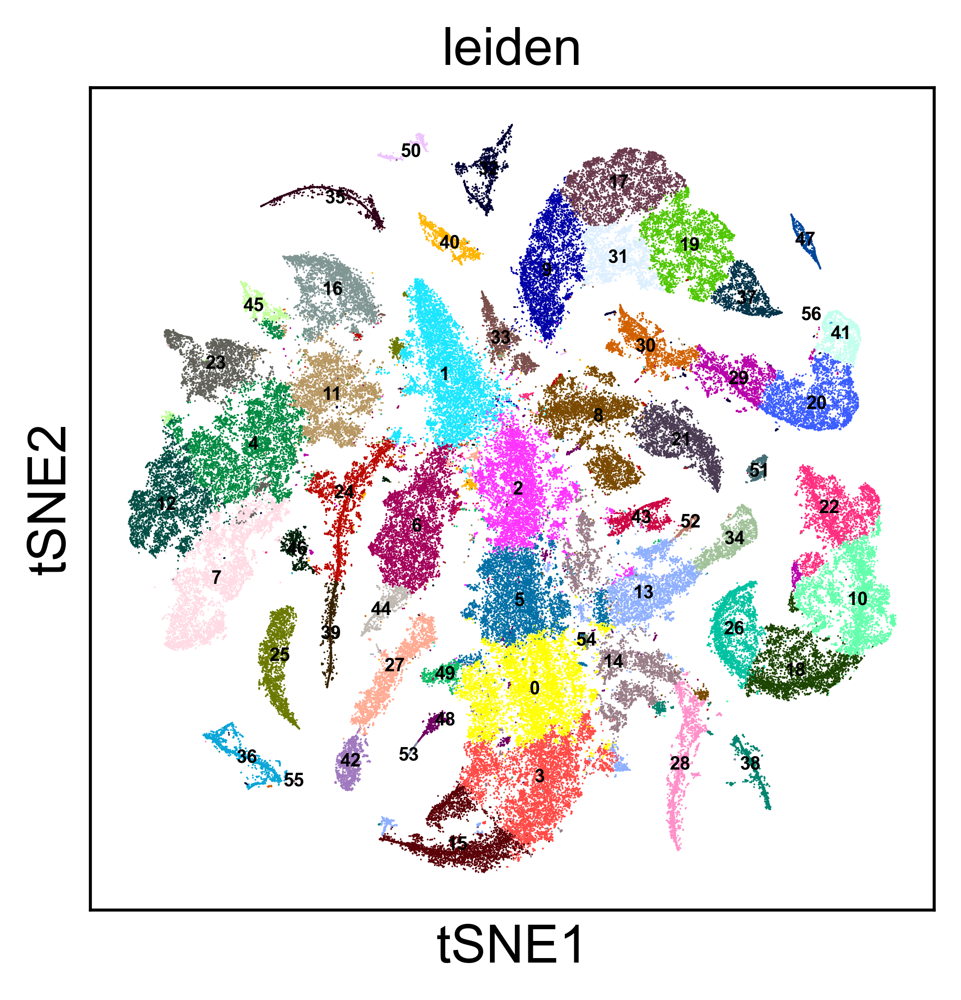

In [135]:
sc.pl.tsne(adata, color=['leiden'],save='scanpy_meta_tsne.pdf',legend_fontsize=5,legend_loc="on data")

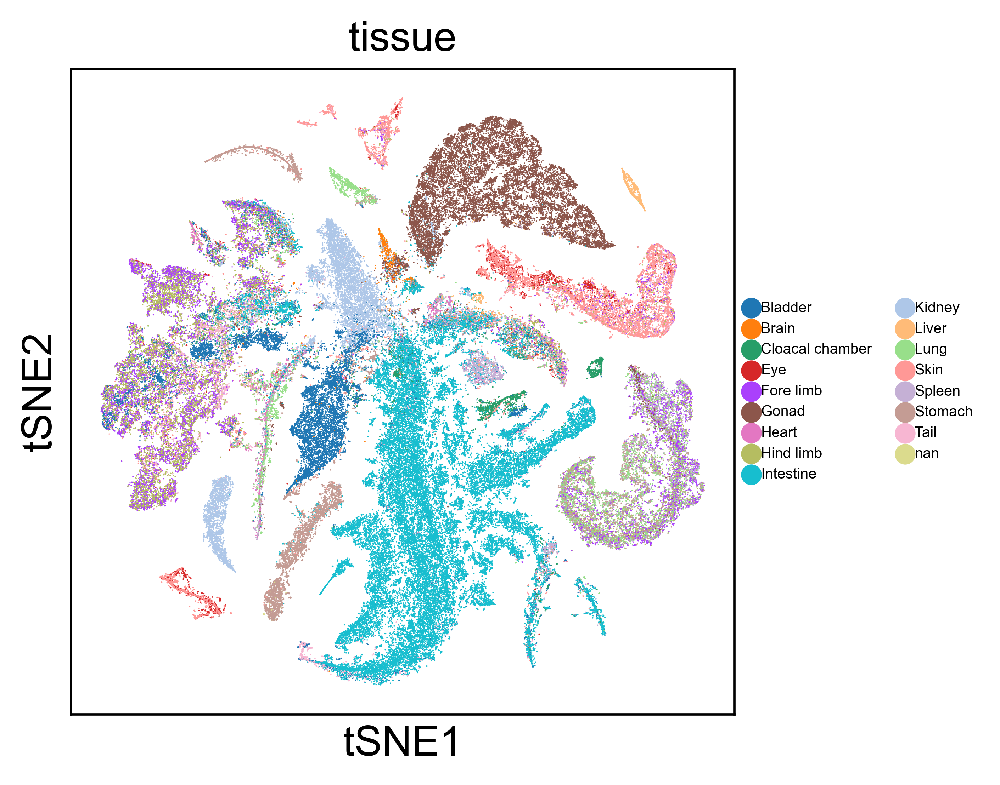

In [133]:
sc.pl.tsne(adata, color=['tissue'],save='scanpy_meta_tissue_tsne.pdf',legend_fontsize=5)

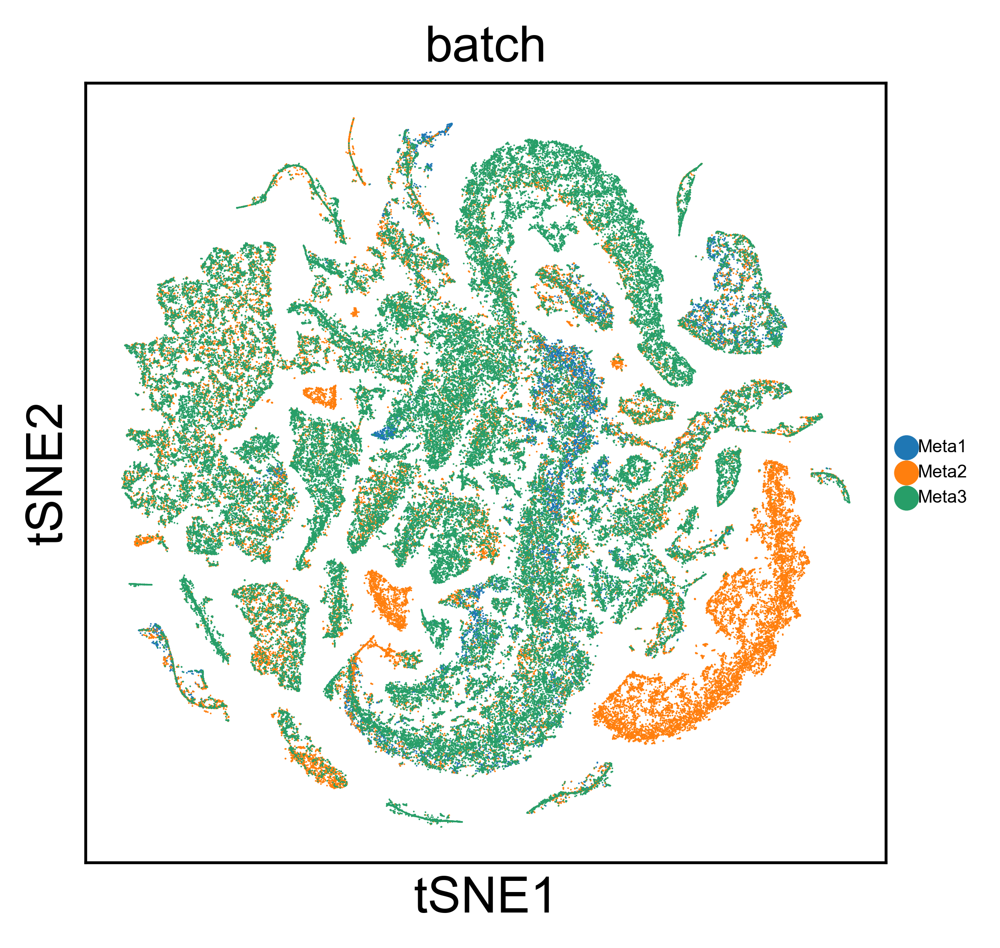

In [88]:
sc.pl.tsne(adata, color=['batch'],save='scanpy_meta_batch_tsne2.pdf',legend_fontsize=5)

In [139]:
adata.write("metasctscanpy.h5ad",compression=True)

In [8]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')

C:\Users\ggj\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


In [9]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges','scores', 'pvals_adj']}).to_csv("meta_marker.csv")

In [132]:
adata=sc.read("metasctscanpy.h5ad")

In [93]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')

ranking genes


C:\Users\ggj\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:49)


In [96]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).to_csv("meta_marker_name.csv")

In [108]:
geneuse=pd.read_csv("top4.csv")["x"].values

In [111]:
geneuse=pd.read_csv("genetop4_order.csv")["x"].values

In [113]:
sc.pl.matrixplot(adata, geneuse, 'leiden', dendrogram=True, cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression',save="plot_meta.pdf")

C:\Users\ggj\anaconda3\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [110]:
adata.uns["dendrogram_['leiden']"]

{'linkage': array([[1.80000000e+01, 2.60000000e+01, 7.48661798e-02, 2.00000000e+00],
        [2.00000000e+01, 2.90000000e+01, 1.77552563e-01, 2.00000000e+00],
        [1.00000000e+01, 5.70000000e+01, 2.21856534e-01, 3.00000000e+00],
        [2.40000000e+01, 3.90000000e+01, 2.68310072e-01, 2.00000000e+00],
        [4.00000000e+00, 1.20000000e+01, 2.74527077e-01, 2.00000000e+00],
        [0.00000000e+00, 3.00000000e+00, 4.33154430e-01, 2.00000000e+00],
        [1.90000000e+01, 3.70000000e+01, 5.02090829e-01, 2.00000000e+00],
        [7.00000000e+00, 6.10000000e+01, 5.38654998e-01, 3.00000000e+00],
        [2.80000000e+01, 3.80000000e+01, 6.10248756e-01, 2.00000000e+00],
        [1.70000000e+01, 3.10000000e+01, 6.20831911e-01, 2.00000000e+00],
        [5.00000000e+00, 1.40000000e+01, 6.88862325e-01, 2.00000000e+00],
        [2.70000000e+01, 4.20000000e+01, 7.74382153e-01, 2.00000000e+00],
        [5.40000000e+01, 6.20000000e+01, 8.37777033e-01, 3.00000000e+00],
        [2.20000000e+01, 5.

In [193]:
adata2=sc.read("meta_markeruse_20211206.h5ad")

In [194]:
test=pd.DataFrame(adata2.X.todense(),index=adata2.obs_names,columns=adata2.var_names)

In [195]:
adata2=sc.AnnData(test)

In [196]:
adata

AnnData object with n_obs × n_vars = 126263 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'leiden', 'organ'
    var: 'features'
    uns: 'pca', 'neighbors', 'leiden', 'batch_colors', 'leiden_colors', 'organ_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [197]:
adata2

AnnData object with n_obs × n_vars = 126263 × 17637

In [198]:
sc.pp.normalize_total(adata2, target_sum=1e4)
sc.pp.log1p(adata2)

normalizing counts per cell
    finished (0:00:02)


In [199]:
adata2.obs['leiden']=adata.obs['leiden']

In [200]:
sc.tl.rank_genes_groups(adata2, groupby='leiden', method='t-test')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:18:24)


In [201]:
adata2.uns['rank_genes_groups']

{'params': {'groupby': 'leiden',
  'reference': 'rest',
  'method': 't-test',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('AMEXTC-0340000260799-LOC102933150', 'AMEXTC-0340000260799-LOC102933150', 'AMEXTC-0340000147025-LOC106488515', 'AMEXTC-0340000023242-collagen', 'AMEXTC-0340000060732-LOC104484772', 'AMEXTC-0340000023242-collagen', 'AMEXTC-0340000066295-ferritin', 'AMEXTC-0340000158014-UCHL1', 'AMEXTC-0340000019606-hypothetical', 'AMEXTC-0340000114746-lgals2', 'AMEXTC-0340000017743-LCP1', 'AMEXTC-0340000060301-VIM', 'AMEXTC-0340000279815-hypothetical', 'AMEXTC-0340000008387-sparc.S', 'AMEXTC-0340000137798-major', 'AMEXTC-0340000125239-LSU', 'AMEXTC-0340000003827-alpha-keratin', 'AMEXTC-0340000020155-LOC101931564', 'AMEXTC-0340000040950-ferritin', 'AMEXTC-0340000159010-LOC108704652', 'AMEXTC-0340000116127-LOC108710314', 'AMEXTC-0340000040950-ferritin', 'AMEXTC-0340000122671-Keratin', 'AMEXTC-0340000042092-UGT2B17', 'AMEXTC-03400001

In [202]:
result = adata2.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges','scores', 'pvals_adj']}).to_csv("meta_raw_marker_20211206.csv")